# Create SageMaker Models Using the PyTorch Model Zoo

---

This notebook's CI test result for us-west-2 is as follows. CI test results in other regions can be found at the end of the notebook. 

![This us-west-2 badge failed to load. Check your device's internet connectivity, otherwise the service is currently unavailable](https://h75twx4l60.execute-api.us-west-2.amazonaws.com/sagemaker-nb/us-west-2/introduction_to_applying_machine_learning|sagemaker_pytorch_model_zoo|sagemaker_pytorch_model_zoo.ipynb)

---

In this example, we use a Faster R-CNN object detection model from the PyTorch Model Zoo to create bounding boxes for pre-defined object classes.

This notebook showcases an end-to-end example, from loading the Faster R-CNN object detection model weights, saving them to an S3 bucket, to writing an entrypoint file and understanding the key parameters in the SageMaker PyTorchModel API. Finally we deploy the model, perform ML model inference using SageMaker Batch Transform, and view the model output and learn how to interpret the results.


## Imports

In [ ]:
!pip install --upgrade sagemaker
!pip install torch==1.9.1
!pip install torchvision==0.10.1

In [58]:
# Import the required libraries
import ast
import boto3
import numpy as np
import os
import sagemaker
import torch
import torchvision
from sagemaker.pytorch.model import PyTorchModel

# Visualize the SageMaker Batch Transform output
from urllib.parse import urlparse
from torchvision.io import read_image
from torchvision.utils import draw_bounding_boxes

## Step 1: Setup

In [ ]:
sagemaker_session = sagemaker.Session()

# Set a default S3 bucket
default_bucket = sagemaker_session.default_bucket()

# Get the current AWS region
aws_region = boto3.Session().region_name

# Get the SageMaker Execution Role
role_arn = sagemaker.get_execution_role()

In [61]:
# Only CPU containers support torchvision::nms
INSTANCE_TYPE = "ml.m5.xlarge"
INSTANCE_COUNT = 1
BUCKET = os.path.join("s3://", default_bucket)

DATA_PATH = os.path.join(BUCKET, "images")
IMAGE_NAME = "cars.jpg"
RANDOM_STRING_LENGTH = 16
MODEL_NAME = "FasterRCNNResnet50"

# Needs to be set to version 1.2 or higher to enable automatic PyTorch model repackaging
FRAMEWORK_VERSION = "1.2"
ENTRY_POINT_FILE_NAME = "inference.py"

SAGEMAKER_EXECUTION_ROLE_ARN = role_arn
MODEL_ARTIFACTS_FILE_NAME = os.path.join(BUCKET, "modelzoo/fasterrcnn_resnet50_fpn/model.tar.gz")
IMAGE_URI = sagemaker.image_uris.retrieve(
    framework="pytorch",
    region=aws_region,
    version="1.9.1",
    py_version="py38",
    image_scope="inference",
    instance_type=INSTANCE_TYPE,
)

## Step 2: Loading an ML Model from the PyTorch Model Zoo


Next we define an object detection model and save the model weights. Typically, we save a PyTorch model as a file with extension `.pt` or `.pth`. The below code snippet downloads a pre-trained Faster R-CNN ResNet-50 model from the PyTorch Model Zoo.

Source: https://pytorch.org/vision/0.11/models.html


In [62]:
print(torch.__version__, torchvision.__version__)

H = 1080
W = 1920
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

1.9.1+cu102 0.10.1+cu102


Below we save the model. SageMaker Batch Transform requires as input some model weights artifact, so we save the pre-trained model as `model.pt`. If we want to create a custom model, this is where we switch out the model weights with our trained model.

In [63]:
scripted_fn = torch.jit.script(model, torch.randn(1, 3, H, W))
scripted_fn.save("model.pt")

## Step 3: Save and Upload Model Artifacts to S3

Since we use Amazon SageMaker for inference, we need to upload the model weights to an S3 bucket. We can do so with the command below, or by downloading and simply dragging and dropping the file directly into S3. We first package the group of files within model.pt to an archive and copy the model weights in `model.tar.gz` from the local machine to the S3 bucket so it can be accessed by SageMaker Batch Transform. 

In [ ]:
!tar -czvf model.tar.gz model.pt
!aws s3 cp model.tar.gz $MODEL_ARTIFACTS_FILE_NAME

Next, we copy our input image over to S3. We use the `cars.jpg` located in this folder. 

Source: [Photo](https://unsplash.com/photos/Jh6NX2OjNOU) by [Caleb De Marco](https://unsplash.com/@calebcsdm) on [Unsplash](https://unsplash.com/)

In [52]:
car_image_path = os.path.join(DATA_PATH, IMAGE_NAME)

In [ ]:
!aws s3 cp $IMAGE_NAME $car_image_path

## Step 4: Building ML Model Inference Scripts
Now we go over our entrypoint file `inference.py`. We can deploy a PyTorch model trained outside of SageMaker by using the *PyTorchModel* class. First we instantiate the *PytorchModelZoo* object inside `run.py`. Then we construct an `inference.py` entrypoint file to perform inference using SageMaker Batch Transform on sample data hosted in S3.

### Creating a PyTorchModel Object

In [54]:
model = PyTorchModel(
    name=MODEL_NAME,
    model_data=MODEL_ARTIFACTS_FILE_NAME,
    entry_point=ENTRY_POINT_FILE_NAME,
    framework_version=FRAMEWORK_VERSION,
    role=SAGEMAKER_EXECUTION_ROLE_ARN,
    sagemaker_session=sagemaker_session,
    image_uri=IMAGE_URI,
)

### Understanding The Entrypoint File (inference.py)

Our model artifacts (model checkpoint) referenced by the `model_data` parameter in `PyTorchModel` are loaded from S3 and packaged as part of the SageMaker model docker image. In order to use the trained ML model for serving, we need to instruct the *PyTorchModel* class how to a recover a PyTorch model from the static checkpoint. This deployed endpoint also interacts with REST API calls, we need to tell it how to parse an incoming request to the model. These instructions need to be defined in the entrypoint file.

The *entry_point* parameter references a python file named `inference.py`. It defines model loading, input data preprocessing, ML model prediction logic, and output post-processing.

`inference.py` contains the following functions. In our example, we implement the `model_fn`, `input_fn`, `predict_fn` and `output_fn` functions to override the default [PyTorch inference handler](https://github.com/aws/sagemaker-pytorch-inference-toolkit/blob/master/src/sagemaker_pytorch_serving_container/default_pytorch_inference_handler.py).

1. `model_fn`: Takes in a directory containing static model checkpoints in the inference image. Opens and loads the model from a specified path, and returns a *PyTorch model*.
2. `input_fn`: Takes in the payload of the incoming request (*request_body*) and the content type of an upcoming request (*request_content_type*) as input. Handles data decoding. This function that needs to be adjusted for what input the model is expecting
3. `predict_fn`: Calls a model on data deserialized in `input_fn`. Perform prediction on the deserialized object, with the loaded model.
4. `output_fn`: Serialize the prediction result into the desired response content type. Serializes predictions from `predict_fn` to JSON, CSV or NPY format.

The `inference.py` script is used as an input to the Batch Transform job. The Batch transform API provision compute and run the `inference.py` script.


## Step 5: Launching a SageMaker Batch Transform job

For this example, we obtain model inference results through a SageMaker Batch Transform job. Batch Inference does not use endpoints as the other SageMaker inference options do. We instantiate a [sagemaker.transformer.Transformer](https://sagemaker.readthedocs.io/en/stable/api/inference/transformer.html) object that starts a Batch Transform job with the provided parameters.

In [ ]:
transformer = model.transformer(instance_type=INSTANCE_TYPE, instance_count=INSTANCE_COUNT)

In [ ]:
transformer.transform(
    data=DATA_PATH,
    data_type="S3Prefix",
    content_type="application/x-image",
    wait=True,
)

## Step 6: Visualizing Results

During inference, the model requires only the input tensors, and returns the post-processed predictions as a List[Dict[Tensor]], one for each input image. The fields of the Dict are as follows, where N is the number of detections:

1. boxes (FloatTensor[N, 4]): the predicted boxes in [x1, y1, x2, y2] format, with 0 <= x1 < x2 <= W and 0 <= y1 < y2 <= H, where W is the width of the image and H is the height of the image.
2. labels (Int64Tensor[N]): the predicted labels for each detection. see a list of classes and their mappings here: [COCO Dataset Object Mapping](https://tech.amikelive.com/node-718/what-object-categories-labels-are-in-coco-dataset/)
3. scores (Tensor[N]): the scores of each detection

For more details on the output, you may refer to the [PyTorch FasterRCNN FPN Documentation](https://pytorch.org/vision/main/models/generated/torchvision.models.detection.fasterrcnn_resnet50_fpn.html#torchvision.models.detection.fasterrcnn_resnet50_fpn) 

The model outputs bounding boxes with confidence scores. We can optimize probability thresholds on these scores to remove bounding boxes for which the model is not confident. Finally, we visualize these mappings to understand our output in a more meaningful way. We set the probability threshold to .75 for this use case. 

Source: [Drawing Bounding Boxes with PyTorch](https://pytorch.org/vision/main/generated/torchvision.utils.draw_bounding_boxes.html)

### Process Output

First we read the output path from our transformer object

In [44]:
def get_output_from_s3(s3uri, file_name):
    parsed_url = urlparse(s3uri)
    bucket_name = parsed_url.netloc
    prefix = parsed_url.path[1:]
    s3 = boto3.resource("s3")
    obj = s3.Object(bucket_name, "{}/{}".format(prefix, file_name))
    return obj.get()["Body"].read().decode("utf-8")

In [ ]:
# Output path from batch transform job
output_path = transformer.output_path
output_path

In [24]:
# Get the output file from S3
predictions = get_output_from_s3(output_path, "cars.jpg.out")

Next, we process this output file and visualize our predictions. Below we specify our confidence thresholds. We get the list of classes from the COCO Dataset Object Mapping we linked above. The model outputs bounding boxes with confidence scores. We can optimize probability thresholds on these scores to remove bounding boxes for which the model is not confident. The following code snippets process the predictions in the output file and draw bounding boxes on the predictions where the score is above our confidence threshold. We set the probability threshold, `CONF_THRESH` to .75 for this example. 

In [25]:
CONF_THRESH = 0.75
CLASSES = [
    "__background__",
    "person",
    "bicycle",
    "car",
    "motorcycle",
    "airplane",
    "bus",
    "train",
    "truck",
    "boat",
    "traffic light",
    "fire hydrant",
    "N/A",
    "stop sign",
    "parking meter",
    "bench",
    "bird",
    "cat",
    "dog",
    "horse",
    "sheep",
    "cow",
    "elephant",
    "bear",
    "zebra",
    "giraffe",
    "N/A",
    "backpack",
    "umbrella",
    "N/A",
    "N/A",
    "handbag",
    "tie",
    "suitcase",
    "frisbee",
    "skis",
    "snowboard",
    "sports ball",
    "kite",
    "baseball bat",
    "baseball glove",
    "skateboard",
    "surfboard",
    "tennis racket",
    "bottle",
    "N/A",
    "wine glass",
    "cup",
    "fork",
    "knife",
    "spoon",
    "bowl",
    "banana",
    "apple",
    "sandwich",
    "orange",
    "broccoli",
    "carrot",
    "hot dog",
    "pizza",
    "donut",
    "cake",
    "chair",
    "couch",
    "potted plant",
    "bed",
    "N/A",
    "dining table",
    "N/A",
    "N/A",
    "toilet",
    "N/A",
    "tv",
    "laptop",
    "mouse",
    "remote",
    "keyboard",
    "cell phone",
    "microwave",
    "oven",
    "toaster",
    "sink",
    "refrigerator",
    "N/A",
    "book",
    "clock",
    "vase",
    "scissors",
    "teddy bear",
    "hair drier",
    "toothbrush",
]

In [26]:
def process_batch_transform_output(predictions):
    predictions = ast.literal_eval(predictions)
    for pred in predictions[1:]:
        pred = pred[0]
        boxes = np.array(pred["boxes"])
        labels = np.array(pred["labels"])
        scores = np.array(pred["scores"])

        scores_idx = scores >= CONF_THRESH
        boxes_meet = boxes[scores_idx, :]
        labels_meet = labels[scores_idx]
        scores_meet = scores[scores_idx]

        labels_str = [CLASSES[i] for i in labels_meet]

        # Return a tuple containing labels, label index, score, and bounding box
        processed_predictions = list(zip(labels_str, labels_meet, scores_meet, boxes_meet))
        return processed_predictions


def visualize_batch_transform_output(input_image, processed_predictions):
    # read input image from your computer
    img = read_image(input_image)
    for label, label_index, score, box in processed_predictions:
        label = label + ", score: " + str(round(score, 2))
        # draw bounding box and fill color
        box = torch.tensor(box)
        box = box.unsqueeze(0)
        img = draw_bounding_boxes(img, box, width=5, labels=[label], font_size=24)

    # transform this image to PIL image
    img = torchvision.transforms.ToPILImage()(img)

    # display output
    return img

In [27]:
# Process the predictions in the output file
processed_predictions = process_batch_transform_output(predictions)

Finally, we visualize these mappings to understand our output. 

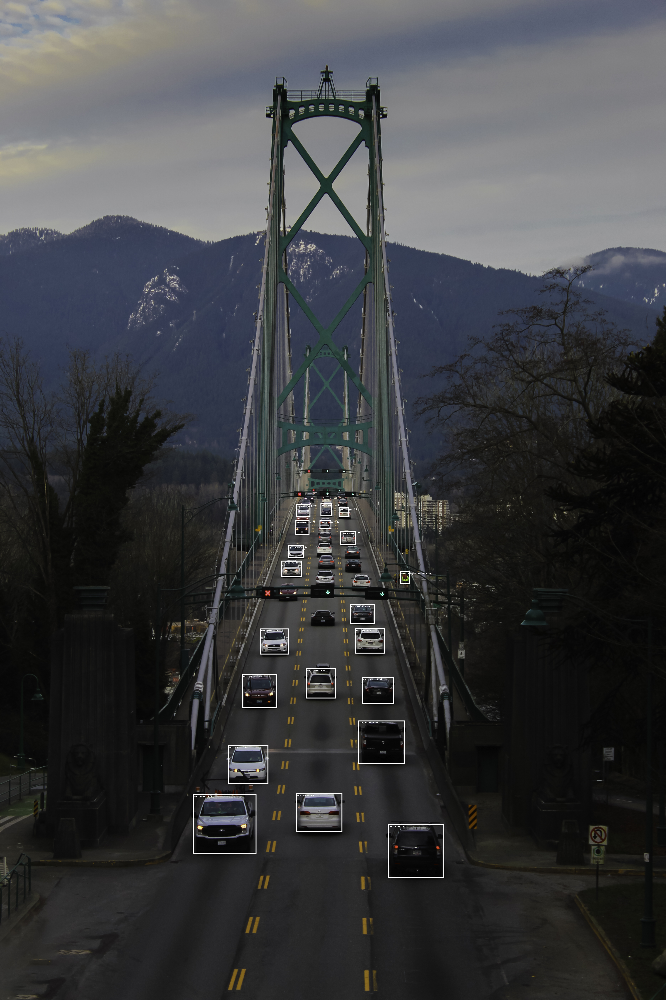

In [28]:
img = visualize_batch_transform_output(IMAGE_NAME, processed_predictions)
img.show()

Save your output with the following code

In [29]:
img.save("cars.out.jpg")

## Summary

In this example, we walked through an end-to-end example for performing ML model inference using an object detection model from the PyTorch Model Zoo using SageMaker Batch Transform. We covered loading the Faster R-CNN object detection model weights, saving them to an S3 bucket, writing an entrypoint file and understanding the key parameters in the *PyTorchModel* API. Finally, we deployed the model and performed ML model inference, visualized the model output, and learned how to interpret the results.

## Notebook CI Test Results

This notebook was tested in multiple regions. The test results are as follows, except for us-west-2 which is shown at the top of the notebook.

![This us-east-1 badge failed to load. Check your device's internet connectivity, otherwise the service is currently unavailable](https://h75twx4l60.execute-api.us-west-2.amazonaws.com/sagemaker-nb/us-east-1/introduction_to_applying_machine_learning|sagemaker_pytorch_model_zoo|sagemaker_pytorch_model_zoo.ipynb)

![This us-east-2 badge failed to load. Check your device's internet connectivity, otherwise the service is currently unavailable](https://h75twx4l60.execute-api.us-west-2.amazonaws.com/sagemaker-nb/us-east-2/introduction_to_applying_machine_learning|sagemaker_pytorch_model_zoo|sagemaker_pytorch_model_zoo.ipynb)

![This us-west-1 badge failed to load. Check your device's internet connectivity, otherwise the service is currently unavailable](https://h75twx4l60.execute-api.us-west-2.amazonaws.com/sagemaker-nb/us-west-1/introduction_to_applying_machine_learning|sagemaker_pytorch_model_zoo|sagemaker_pytorch_model_zoo.ipynb)

![This ca-central-1 badge failed to load. Check your device's internet connectivity, otherwise the service is currently unavailable](https://h75twx4l60.execute-api.us-west-2.amazonaws.com/sagemaker-nb/ca-central-1/introduction_to_applying_machine_learning|sagemaker_pytorch_model_zoo|sagemaker_pytorch_model_zoo.ipynb)

![This sa-east-1 badge failed to load. Check your device's internet connectivity, otherwise the service is currently unavailable](https://h75twx4l60.execute-api.us-west-2.amazonaws.com/sagemaker-nb/sa-east-1/introduction_to_applying_machine_learning|sagemaker_pytorch_model_zoo|sagemaker_pytorch_model_zoo.ipynb)

![This eu-west-1 badge failed to load. Check your device's internet connectivity, otherwise the service is currently unavailable](https://h75twx4l60.execute-api.us-west-2.amazonaws.com/sagemaker-nb/eu-west-1/introduction_to_applying_machine_learning|sagemaker_pytorch_model_zoo|sagemaker_pytorch_model_zoo.ipynb)

![This eu-west-2 badge failed to load. Check your device's internet connectivity, otherwise the service is currently unavailable](https://h75twx4l60.execute-api.us-west-2.amazonaws.com/sagemaker-nb/eu-west-2/introduction_to_applying_machine_learning|sagemaker_pytorch_model_zoo|sagemaker_pytorch_model_zoo.ipynb)

![This eu-west-3 badge failed to load. Check your device's internet connectivity, otherwise the service is currently unavailable](https://h75twx4l60.execute-api.us-west-2.amazonaws.com/sagemaker-nb/eu-west-3/introduction_to_applying_machine_learning|sagemaker_pytorch_model_zoo|sagemaker_pytorch_model_zoo.ipynb)

![This eu-central-1 badge failed to load. Check your device's internet connectivity, otherwise the service is currently unavailable](https://h75twx4l60.execute-api.us-west-2.amazonaws.com/sagemaker-nb/eu-central-1/introduction_to_applying_machine_learning|sagemaker_pytorch_model_zoo|sagemaker_pytorch_model_zoo.ipynb)

![This eu-north-1 badge failed to load. Check your device's internet connectivity, otherwise the service is currently unavailable](https://h75twx4l60.execute-api.us-west-2.amazonaws.com/sagemaker-nb/eu-north-1/introduction_to_applying_machine_learning|sagemaker_pytorch_model_zoo|sagemaker_pytorch_model_zoo.ipynb)

![This ap-southeast-1 badge failed to load. Check your device's internet connectivity, otherwise the service is currently unavailable](https://h75twx4l60.execute-api.us-west-2.amazonaws.com/sagemaker-nb/ap-southeast-1/introduction_to_applying_machine_learning|sagemaker_pytorch_model_zoo|sagemaker_pytorch_model_zoo.ipynb)

![This ap-southeast-2 badge failed to load. Check your device's internet connectivity, otherwise the service is currently unavailable](https://h75twx4l60.execute-api.us-west-2.amazonaws.com/sagemaker-nb/ap-southeast-2/introduction_to_applying_machine_learning|sagemaker_pytorch_model_zoo|sagemaker_pytorch_model_zoo.ipynb)

![This ap-northeast-1 badge failed to load. Check your device's internet connectivity, otherwise the service is currently unavailable](https://h75twx4l60.execute-api.us-west-2.amazonaws.com/sagemaker-nb/ap-northeast-1/introduction_to_applying_machine_learning|sagemaker_pytorch_model_zoo|sagemaker_pytorch_model_zoo.ipynb)

![This ap-northeast-2 badge failed to load. Check your device's internet connectivity, otherwise the service is currently unavailable](https://h75twx4l60.execute-api.us-west-2.amazonaws.com/sagemaker-nb/ap-northeast-2/introduction_to_applying_machine_learning|sagemaker_pytorch_model_zoo|sagemaker_pytorch_model_zoo.ipynb)

![This ap-south-1 badge failed to load. Check your device's internet connectivity, otherwise the service is currently unavailable](https://h75twx4l60.execute-api.us-west-2.amazonaws.com/sagemaker-nb/ap-south-1/introduction_to_applying_machine_learning|sagemaker_pytorch_model_zoo|sagemaker_pytorch_model_zoo.ipynb)
